## **Hexaboard Visual Inspection**

In [1]:
# --- Default libraries ---
import os
import warnings
from pathlib import Path

# --- Working directory ---
PROJECT_DIR = Path().resolve()
PROJECT_ROOT_NAME = 'visual-inspection'

while PROJECT_DIR.name != PROJECT_ROOT_NAME and PROJECT_DIR != PROJECT_DIR.parent:
    PROJECT_DIR = PROJECT_DIR.parent

if Path().resolve() != PROJECT_DIR:
    os.chdir(PROJECT_DIR)

DATA_DIR = PROJECT_DIR / 'data'
LOG_DIR = PROJECT_DIR / 'logs'

# --- Data preprocessing & visualization ---
import numpy as np

# --- Deep learning ---
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import transforms

# --- Custom modules ---
from src.configs import TrainConfig
from src.engine import AutoencoderTrainer
from src.models import CNNAutoencoder
from src.utils import EarlyStopping
from src.utils.data import HexaboardDataset
from src.utils.viz import *

# --- Settings ---
warnings.filterwarnings('ignore')
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed_all(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

### **1. Data Processing**

(13, 9, 1016, 1640, 3)


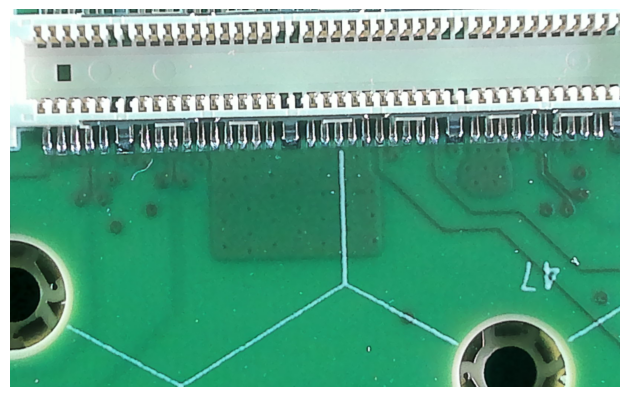

In [2]:
# Read the image
image = np.load(DATA_DIR / 'train' / 'aligned_images1.npy')

# Convert BGR to RGB
image = image[..., ::-1]
print(image.shape)

# Visualize segments
visualize_segments(
    data=image,
    num_samples=1,
    randomize=True
)

In [3]:
# Convert np.ndarray to torch.Tensor: (H, W, C) -> (C, H, W)
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Create the hexaboard datasets
train_dataset = HexaboardDataset(root=DATA_DIR / 'train', transform=transform)
val_dataset = HexaboardDataset(root=DATA_DIR / 'val', transform=transform)
test_dataset = HexaboardDataset(root=DATA_DIR / 'test', transform=transform)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")
print(f"Test dataset size: {len(test_dataset)}")

Train dataset size: 720
Validation dataset size: 90
Test dataset size: 90


### **2. Train the Model**

In [4]:
# Initialize the model
model = CNNAutoencoder(
    height=train_dataset.height,
    width=train_dataset.width,
    latent_dim=32,
    init_filters=128,
    layers=[2, 2, 2]
).to(device)
model

CNNAutoencoder(
  (conv1): Conv2d(3, 128, kernel_size=(10, 16), stride=(5, 8), padding=(5, 0), bias=False)
  (bn1): GroupNorm(1, 128, eps=1e-05, affine=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (encoder_layers): ModuleList(
    (0): Sequential(
      (0): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): GroupNorm(1, 128, eps=1e-05, affine=True)
        (2): ReLU(inplace=True)
      )
      (1): Sequential(
        (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): GroupNorm(1, 128, eps=1e-05, affine=True)
        (2): ReLU(inplace=True)
      )
    )
    (1): Sequential(
      (0): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): GroupNorm(1, 256, eps=1e-05, affine=True)
        (2): ReLU(inplace=True)
      )
      (1): S

In [5]:
# Count parameters in the model
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
num_params

2847360

In [6]:
# Training configurations
train_config = TrainConfig(
    batch_size=8,
    num_epochs=50,
    start_epoch=0,
    logging_dir=str(LOG_DIR),
    logging_steps=25,
    save_best=True,
    save_ckpt=True,
    device='cuda',
    num_workers=0,
    pin_memory=True
)

In [7]:
# Intialize the trainer
learning_rate = 1e-3
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate, eps=1e-4)
scheduler = optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.96)
callbacks = EarlyStopping(monitor='val_loss', mode='min', patience=5)
trainer = AutoencoderTrainer(
    model=model,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    test_dataset=test_dataset,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    callbacks=[callbacks],
    config=train_config
)

In [8]:
# Train the model
history, model = trainer.train()

Training:   0%|          | 0/4500 [00:00<?, ?it/s]

step: 25/4500 | train_loss: 0.6540
step: 50/4500 | train_loss: 0.6492
step: 75/4500 | train_loss: 0.6468
epoch: 1/50 | val_loss: 0.6322
step: 100/4500 | train_loss: 0.6412
step: 125/4500 | train_loss: 0.6392
step: 150/4500 | train_loss: 0.6395
step: 175/4500 | train_loss: 0.6397
epoch: 2/50 | val_loss: 0.6303
step: 200/4500 | train_loss: 0.6391
step: 225/4500 | train_loss: 0.6371
step: 250/4500 | train_loss: 0.6367
epoch: 3/50 | val_loss: 0.6257
step: 275/4500 | train_loss: 0.6315
step: 300/4500 | train_loss: 0.6344
step: 325/4500 | train_loss: 0.6342
step: 350/4500 | train_loss: 0.6325
epoch: 4/50 | val_loss: 0.6211
step: 375/4500 | train_loss: 0.6287
step: 400/4500 | train_loss: 0.6274
step: 425/4500 | train_loss: 0.6274
step: 450/4500 | train_loss: 0.6275
epoch: 5/50 | val_loss: 0.6189
step: 475/4500 | train_loss: 0.6264
step: 500/4500 | train_loss: 0.6256
step: 525/4500 | train_loss: 0.6246
epoch: 6/50 | val_loss: 0.6142
step: 550/4500 | train_loss: 0.6193
step: 575/4500 | train_lo

In [ ]:
# Load the checkpoint
trainer.load_checkpoint(str(LOG_DIR / model.__class__.__name__ / 'checkpoints' / 'run_02.pt'))

44

In [10]:
# Continue training
history, model = trainer.train()

Training:  88%|########8 | 3960/4500 [00:00<?, ?it/s]

step: 3975/4500 | train_loss: 0.5928
step: 4000/4500 | train_loss: 0.5940
step: 4025/4500 | train_loss: 0.5940
step: 4050/4500 | train_loss: 0.5938
epoch: 45/50 | val_loss: 0.5876
step: 4075/4500 | train_loss: 0.5910
step: 4100/4500 | train_loss: 0.5931
step: 4125/4500 | train_loss: 0.5936
epoch: 46/50 | val_loss: 0.5874
step: 4150/4500 | train_loss: 0.5892
step: 4175/4500 | train_loss: 0.5934
step: 4200/4500 | train_loss: 0.5934
step: 4225/4500 | train_loss: 0.5938
epoch: 47/50 | val_loss: 0.5872
step: 4250/4500 | train_loss: 0.5934
step: 4275/4500 | train_loss: 0.5935
step: 4300/4500 | train_loss: 0.5936
epoch: 48/50 | val_loss: 0.5872
step: 4325/4500 | train_loss: 0.5950
step: 4350/4500 | train_loss: 0.5932
step: 4375/4500 | train_loss: 0.5933
step: 4400/4500 | train_loss: 0.5936
epoch: 49/50 | val_loss: 0.5874
step: 4425/4500 | train_loss: 0.5919
step: 4450/4500 | train_loss: 0.5931
step: 4475/4500 | train_loss: 0.5932
step: 4500/4500 | train_loss: 0.5933
epoch: 50/50 | val_loss: 0

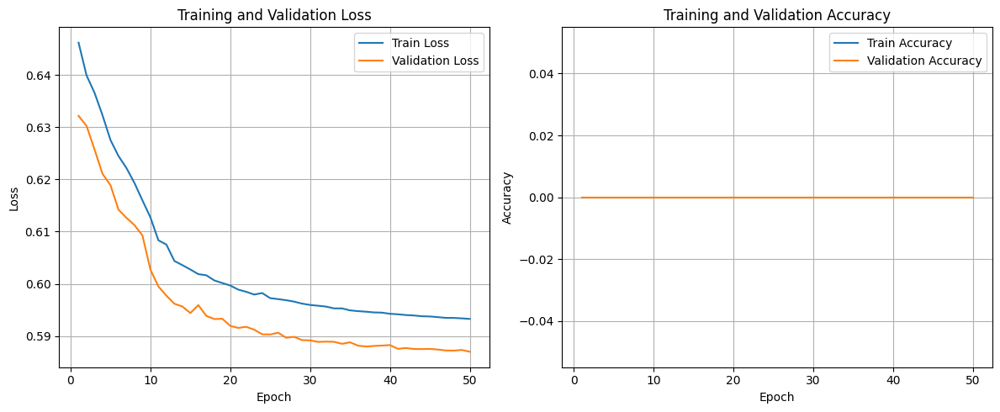

In [11]:
# Visualize training history
plot_history(history)

In [8]:
# Load the best model
model_path = trainer.best_model_path
model_path = str(LOG_DIR / model.__class__.__name__ / 'best' / 'run_01.pt')
trainer.load_best_model(model_path)

In [9]:
# Evaluate the model on the test set (a good example)
test_loss_good, y_true_good, y_pred_good = trainer.evaluate()

test_loss: 0.5910


In [10]:
# Evaluate the model on a bad example
bad_dataset = HexaboardDataset(root=DATA_DIR / 'bad_example', transform=transform)
trainer.test_loader = DataLoader(
    dataset=bad_dataset,
    batch_size=train_config.batch_size,
    shuffle=False,
    num_workers=train_config.num_workers,
    pin_memory=train_config.pin_memory
)
test_loss_bad, y_true_bad, y_pred_bad = trainer.evaluate()

test_loss: 0.5946


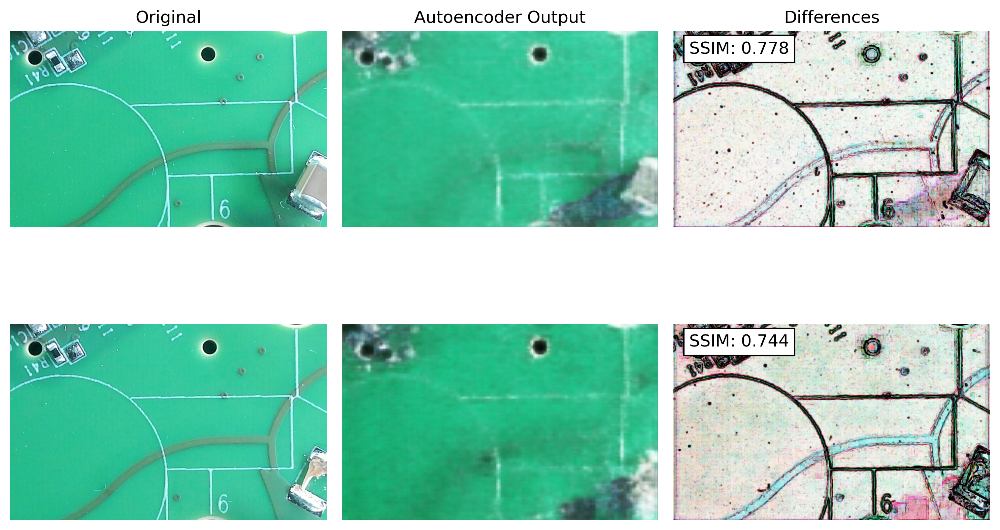

In [ ]:
# Visualize the comparison between the good and bad hexaboards
plot_ae_comparison(
    y_true_good=y_true_good,
    y_pred_good=y_pred_good,
    y_true_bad=y_true_bad,
    y_pred_bad=y_pred_bad,
    segment_idx=83
)

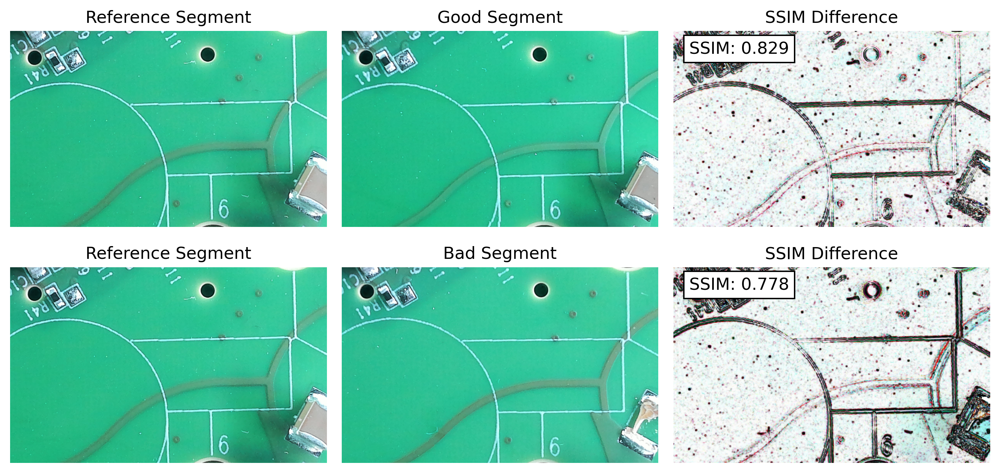

In [12]:
# Visualize the comparison between the 2 images with SSIM
reference_image = np.load(DATA_DIR / 'train' / 'aligned_images1.npy')
good_image = np.load(DATA_DIR / 'train' / 'aligned_images2.npy')
bad_image = np.load(DATA_DIR / 'bad_example' / 'aligned_images5.npy')

plot_pw_comparison(
    reference_image=reference_image,
    good_image=good_image,
    bad_image=bad_image,
    H_seg=11,
    V_seg=6
)